In [2]:
import os

In [10]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from numpy.lib.stride_tricks import sliding_window_view   
import optuna

In [4]:
from one.generator.univariate import UnivariateDataGenerator
from one.models import *
from one.utils import *
from one.scorer.pot import *

In [5]:
%load_ext autoreload
%autoreload 2

In [35]:
plt.rcParams["figure.figsize"] = 40,10
plt.rcParams["font.size"] = 15

# Visualize SKAB Dataset

In [1]:
PATH0 = "./data/skab/valve1/"
PATH1 = "./data/skab/valve2/"
PATH2 = "./data/skab/other/"
PATHS = [PATH0, PATH1, PATH2]

In [7]:
all_files=[]
for root, dirs, files in os.walk(PATH0):
    for file in files:
        if file.endswith(".csv"):
             all_files.append(os.path.join(root, file))

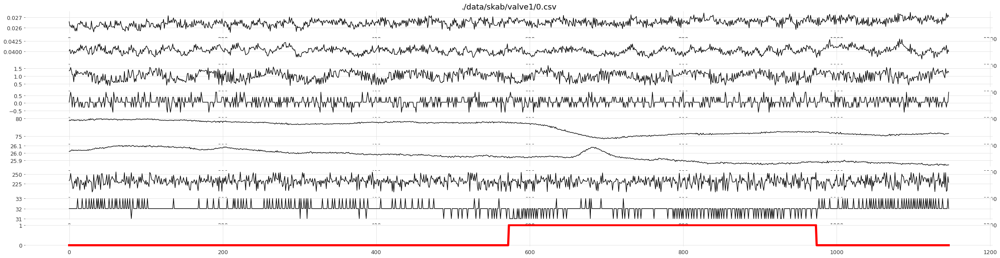

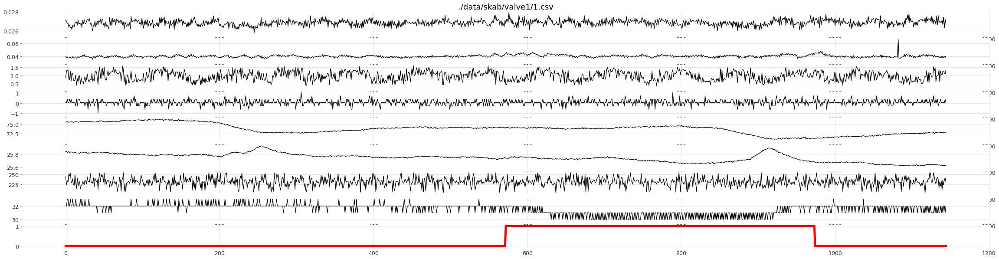

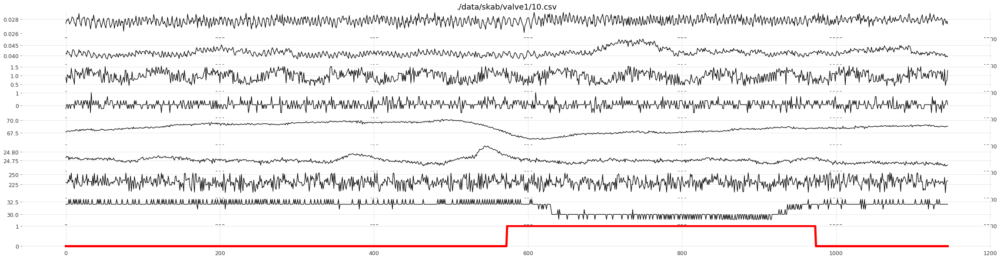

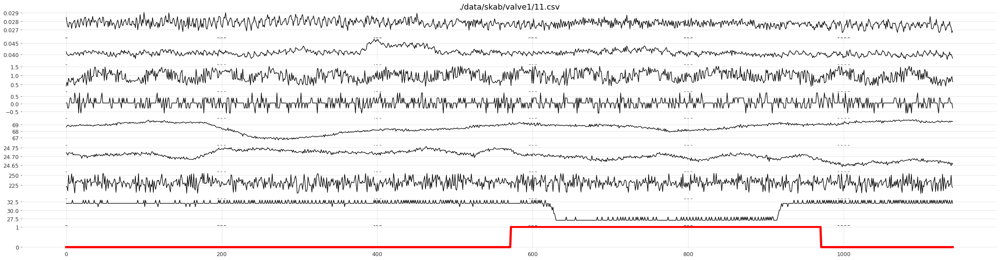

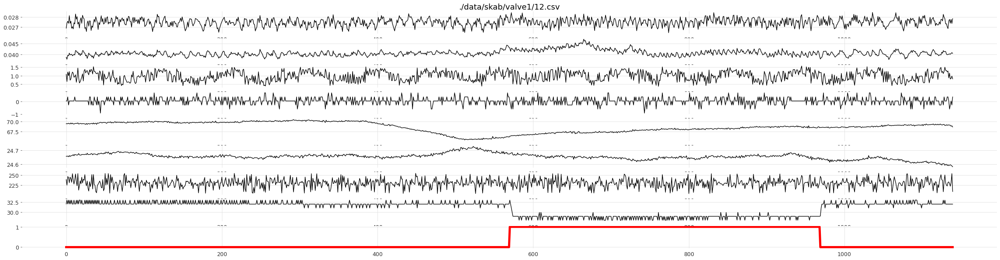

...

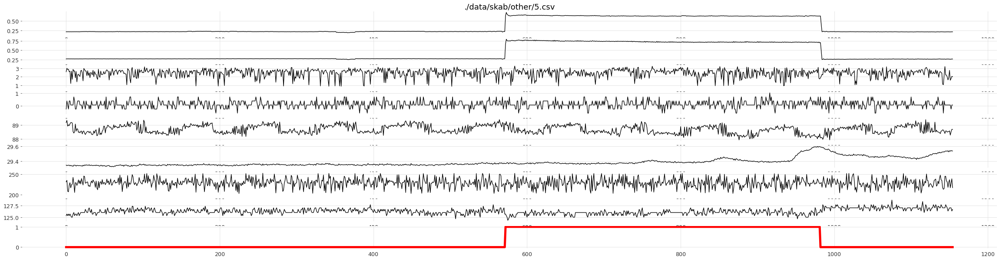

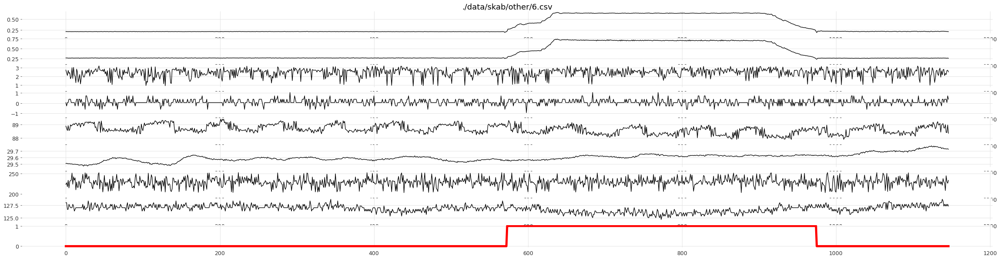

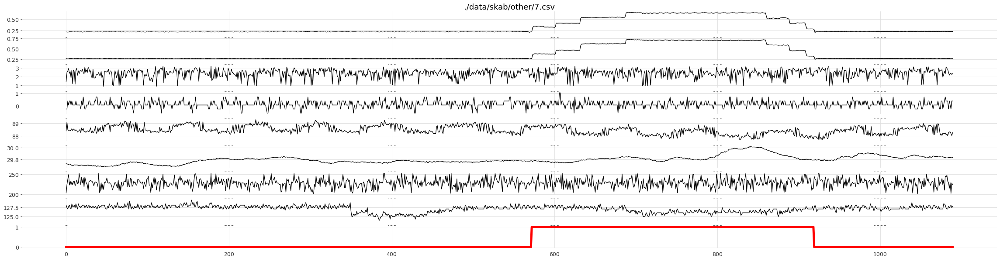

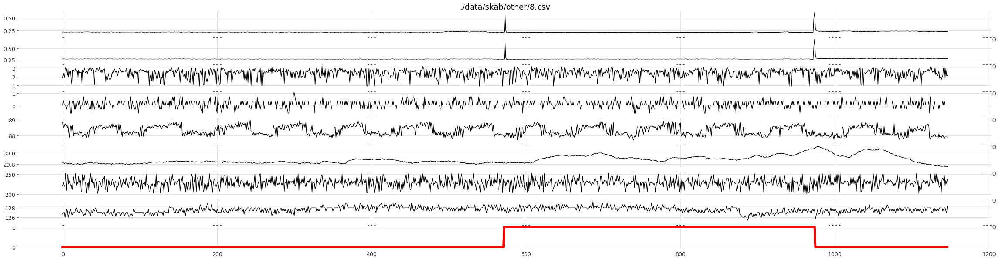

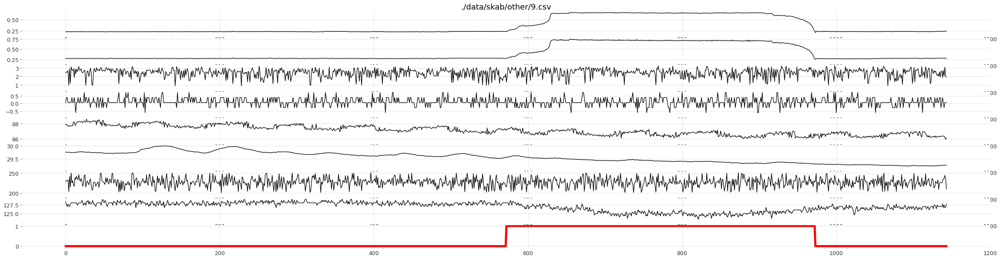

In [312]:
for path in PATHS:
    file_list = get_files_from_path(path)
    
    for f in file_list:
        df = pd.read_csv(path+f,index_col='datetime',sep=';',parse_dates=True)
        if "changepoint" in df.columns:
            df = df.drop(columns="changepoint")
        
        data, labels = df.loc[:, df.columns != "anomaly"].to_numpy(), df.loc[:, df.columns == "anomaly"].to_numpy()

       
        fig, axes = plt.subplots(data.shape[1] + labels.shape[1])
        axes[0].set_title(path+f)
        
        for idx, d in enumerate(data.T):
            axes[idx].plot(d)
        
        axes[-1].plot(labels, "r", linewidth=5)

# Scoring Helper

In [275]:
class ScoreCounter:
    def __init__(self, delay=100):
        self.tp = 0
        self.fp = 0
        self.tn = 0
        self.fn = 0
        
        self.delay = delay if delay is not None else 9999999
        
    def process(self, preds, labels):
        preds = preds.copy()
        labels = labels.copy()
        ground_truth_ones = np.where(labels == 1)[0]
        pred_ones = np.where(preds == 1)[0]
        
        ranges = self._consecutive(ground_truth_ones)
        
        tp, fp, tn, fn = 0, 0, 0, 0
        
        for r in ranges:
            intersect = np.intersect1d(r, pred_ones, assume_unique=True)
            # if alert delay more than 100 timesteps, count that as bad!
            if intersect.size != 0:
                if intersect[0] < r[0]+self.delay:
                    tp += r.size
                else:
                    fn += r.size
 
                preds[intersect] = 0
                pred_ones = np.where(preds == 1)[0]
            else:
                fn += r.size
            
        fp += pred_ones.size
        tn += preds.size - tp - fp - fn
        
        self.tp += tp
        self.fp += fp
        self.tn += tn
        self.fn += fn
        
        
        return
        
        
    def _consecutive(self, data, stepsize=1):
        return np.split(data, np.where(np.diff(data) != stepsize)[0]+1)
    
    
    @property
    def tpr(self):
        return self.tp/(self.fn+self.tp)
    
    @property
    def fpr(self):
        return self.fp/(self.tn+self.fp)
    
    @property
    def tnr(self):
        return self.tn/(self.tn+self.fp)
        
    @property
    def fnr(self):
        return self.fn/(self.fn+self.tp)
        
    @property
    def precision(self):
        return self.tp/(self.tp+self.fp)
    
    @property
    def recall(self):
        return self.tp/(self.tp+self.fn)
    
    @property
    def f1(self):
        return (2*self.precision*self.recall)/(self.precision+self.recall)
    
    

In [211]:
# no delay
tp = 20
fp = 1
tn = 49
fn = 0

scorer = ScoreCounter(delay=10000)
scorer.process(pred, labels)

assert tp == scorer.tp
assert fp == scorer.fp
assert tn == scorer.tn
assert fn == scorer.fn

In [212]:
# with delay
tp = 0
fp = 1
tn = 49
fn = 20

scorer = ScoreCounter(delay=5)
scorer.process(pred, labels)

assert tp == scorer.tp
assert fp == scorer.fp
assert tn == scorer.tn
assert fn == scorer.fn

# Run Experiments

## Untuned Baseline

### Setup

In [250]:
PATH0 = "./data/skab/valve1/"
PATH1 = "./data/skab/valve2/"
PATH2 = "./data/skab/other/"
PATHS = [PATH0, PATH1, PATH2]

In [251]:
SAVE_DIR = "./results/multivar/untuned/"

In [252]:
TRAIN_SIZE = 200

In [81]:
def load_dataset(path):
    df = pd.read_csv(path,index_col='datetime',sep=';',parse_dates=True)
    if "changepoint" in df.columns:
        df = df.drop(columns="changepoint")

    data, labels = df.loc[:, df.columns != "anomaly"].to_numpy(), df.loc[:, df.columns == "anomaly"].to_numpy()
    return data, labels

### Single-variate Ensemble

#### MA

In [154]:
# Moving Average Model
scorer = ScoreCounter()
for path in PATHS:
    file_list = get_files_from_path(path)
    
    for f in file_list:
        data, labels = load_dataset(path+f)
        train_data, train_labels = data[:TRAIN_SIZE], labels[:TRAIN_SIZE]
        test_data, test_labels = data[TRAIN_SIZE:], labels[TRAIN_SIZE:]

        window = 50
        model = MovingAverageModel(window)
        test_extend = np.concatenate((train_data[-window:], test_data))
        
        preds = []
        for series in test_extend.T:
            score = model.get_scores(series)[window:]
        
            # Get threshold (Not needed for Quantile)
            thres = pot(score, 1e-2, 0.9)

            pred = score.copy()
            pred[pred <= thres] = 0
            pred[pred > thres] = 1
            
            preds.append(pred)
            
        ind_preds = np.array(preds)    
        preds = np.any(preds, axis=0)
        
        
        anom_type = path.split("/")[-2]+"-"
        file_name = f.split(".")[0]
        
        save = SAVE_DIR+"ma/"+anom_type+file_name
        os.makedirs(SAVE_DIR+"ma/", exist_ok=True)
        np.savetxt(save+"-individual_preds.txt", ind_preds, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        np.savetxt(save+"-preds.txt", preds, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        
        scorer.process(preds, test_labels)

print(f"{scorer.tp}, {scorer.fp}, {scorer.tn}, {scorer.fn}, {scorer.tpr}, {scorer.fpr}, {scorer.tnr}, {scorer.fnr}, {scorer.precision}, {scorer.recall}, {scorer.f1}")

12971, 1406, 16224, 0, 1.0, 0.07975042541123085, 0.9202495745887691, 0.0, 0.902204910621131, 1.0, 0.9485885622348983


#### Quantile

In [123]:
scorer = ScoreCounter()
for path in PATHS:
    file_list = get_files_from_path(path)
    
    for f in file_list:
        data, labels = load_dataset(path+f)
        train_data, train_labels = data[:TRAIN_SIZE], labels[:TRAIN_SIZE]
        test_data, test_labels = data[TRAIN_SIZE:], labels[TRAIN_SIZE:]

        window = 50
        model = QuantileModel(window)
        test_extend = np.concatenate((train_data[-window:], test_data))
        
        preds = []
        for series in test_extend.T:
            pred = model.get_scores(series)[window:]
            preds.append(pred)
        
        ind_preds = np.array(preds)    
        preds = np.any(preds, axis=0)
        
        
        anom_type = path.split("/")[-2]+"-"
        file_name = f.split(".")[0]
        
        save = SAVE_DIR+"quantile/"+anom_type+file_name
        os.makedirs(SAVE_DIR+"quantile/", exist_ok=True)
        np.savetxt(save+"-individual_preds.txt", ind_preds, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        np.savetxt(save+"-preds.txt", preds, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        
        scorer.process(preds, test_labels)

print(f"{scorer.tp}, {scorer.fp}, {scorer.tn}, {scorer.fn}, {scorer.tpr}, {scorer.fpr}, {scorer.tnr}, {scorer.fnr}, {scorer.precision}, {scorer.recall}, {scorer.f1}")

12971, 5844, 11786, 0, 1.0, 0.3314804310833806, 0.6685195689166193, 0.0, 0.6893967579059261, 1.0, 0.8161454728496823


#### Regression

In [139]:
scorer = ScoreCounter()
for path in PATHS:
    file_list = get_files_from_path(path)
    
    for f in file_list:
        data, labels = load_dataset(path+f)
        train_data, train_labels = data[:TRAIN_SIZE], labels[:TRAIN_SIZE]
        test_data, test_labels = data[TRAIN_SIZE:], labels[TRAIN_SIZE:]

        window = 50
        test_extend = np.concatenate((train_data[-window:], test_data))
        
        preds = []
        for idx, series in enumerate(test_extend.T):
            model = RegressionModel(window)
            model.fit(train_data.T[idx])
 
            score = model.get_scores(series)[0].flatten()
        
            # Get threshold (Not needed for Quantile)
            thres = pot(score, 1e-2, 0.9)

            pred = score.copy()
            pred[pred <= thres] = 0
            pred[pred > thres] = 1
            
            preds.append(pred)
            
        ind_preds = np.array(preds)    
        preds = np.any(preds, axis=0)
        
        
        anom_type = path.split("/")[-2]+"-"
        file_name = f.split(".")[0]
        
        save = SAVE_DIR+"regression/"+anom_type+file_name
        os.makedirs(SAVE_DIR+"regression/", exist_ok=True)
        np.savetxt(save+"-individual_preds.txt", ind_preds, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        np.savetxt(save+"-preds.txt", preds, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        
        scorer.process(preds, test_labels)

print(f"{scorer.tp}, {scorer.fp}, {scorer.tn}, {scorer.fn}, {scorer.tpr}, {scorer.fpr}, {scorer.tnr}, {scorer.fnr}, {scorer.precision}, {scorer.recall}, {scorer.f1}")

12971, 1118, 16512, 0, 1.0, 0.06341463414634146, 0.9365853658536586, 0.0, 0.9206473135069912, 1.0, 0.9586844050258684


#### ARIMA

In [219]:
scorer = ScoreCounter()
for path in PATHS:
    file_list = get_files_from_path(path)
    
    for f in file_list:
        data, labels = load_dataset(path+f)
        train_data, train_labels = data[:TRAIN_SIZE], labels[:TRAIN_SIZE]
        test_data, test_labels = data[TRAIN_SIZE:], labels[TRAIN_SIZE:]

        params = 1, 1, 2
        test_extend = np.concatenate((train_data[-window:], test_data))
        
        preds = []
        for idx, series in enumerate(test_extend.T):
            model = ARIMAModel(*params)
            model.fit(train_data.T[idx])
 
            score = model.get_scores(series).flatten()[window:]
        
            # Get threshold (Not needed for Quantile)
            thres = pot(score, 1e-2, 0.9)

            pred = score.copy()
            pred[pred <= thres] = 0
            pred[pred > thres] = 1
            
            preds.append(pred)
            
        ind_preds = np.array(preds)    
        preds = np.any(preds, axis=0)
        
        
        anom_type = path.split("/")[-2]+"-"
        file_name = f.split(".")[0]
        
        save = SAVE_DIR+"arima/"+anom_type+file_name
        os.makedirs(SAVE_DIR+"arima/", exist_ok=True)
        np.savetxt(save+"-individual_preds.txt", ind_preds, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        np.savetxt(save+"-preds.txt", preds, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        
        scorer.process(preds, test_labels)

print(f"{scorer.tp}, {scorer.fp}, {scorer.tn}, {scorer.fn}, {scorer.tpr}, {scorer.fpr}, {scorer.tnr}, {scorer.fnr}, {scorer.precision}, {scorer.recall}, {scorer.f1}")

/Users/benjaminye/Library/Caches/pypoetry/virtualenvs/one-NMS3jTrz-py3.8/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/benjaminye/Library/Caches/pypoetry/virtualenvs/one-NMS3jTrz-py3.8/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/benjaminye/Library/Caches/pypoetry/virtualenvs/one-NMS3jTrz-py3.8/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/benjaminye/Library/Caches/pypoetry/virtualenvs/one-NMS3jTrz-py3.8/lib/python3.8/site-packages/statsmodels/base/model.py:604: Convergenc

12971, 1101, 16529, 0, 1.0, 0.06245036868973341, 0.9375496313102666, 0.0, 0.9217595224559408, 1.0, 0.959287061346744


### Multivariate Native

#### IForest

In [254]:
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning) 

scorer = ScoreCounter()
for path in PATHS:
    file_list = get_files_from_path(path)
    
    for f in file_list:
        data, labels = load_dataset(path+f)
        train_data, train_labels = data[:TRAIN_SIZE], labels[:TRAIN_SIZE]
        test_data, test_labels = data[TRAIN_SIZE:], labels[TRAIN_SIZE:]

        window = 50
        test_extend = np.concatenate((train_data[-window:], test_data))
        
        model = IsolationForestModel(window)
        model.fit(train_data)

        score = model.get_scores(test_extend)[window:]

        # Get threshold (Not needed for Quantile)
        thres = pot(score, 1e-2, 0.9)

        pred = score.copy()
        pred[pred <= thres] = 0
        pred[pred > thres] = 1

        anom_type = path.split("/")[-2]+"-"
        file_name = f.split(".")[0]
        
        save = SAVE_DIR+"iforest/"+anom_type+file_name
        os.makedirs(SAVE_DIR+"iforest/", exist_ok=True)
        np.savetxt(save+"-individual_preds.txt", pred, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        np.savetxt(save+"-preds.txt", pred, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        
        scorer.process(pred, test_labels)

print(f"{scorer.tp}, {scorer.fp}, {scorer.tn}, {scorer.fn}, {scorer.tpr}, {scorer.fpr}, {scorer.tnr}, {scorer.fnr}, {scorer.precision}, {scorer.recall}, {scorer.f1}")

7053, 86, 17544, 5918, 0.5437514455323413, 0.004878048780487805, 0.9951219512195122, 0.4562485544676586, 0.9879534948872392, 0.5437514455323413, 0.7014420686225759


## F1 Tuned Baseline (50% Train)

### Setup

In [314]:
PATH0 = "./data/skab/valve1/"
PATH1 = "./data/skab/valve2/"
PATH2 = "./data/skab/other/"
PATHS = [PATH0, PATH1, PATH2]

In [315]:
SAVE_DIR = "./results/multivar/f1tuned-50pct/"

In [320]:
TRAIN_SIZE = 200
DELAY = 10
optuna.logging.set_verbosity(optuna.logging.FATAL)

In [317]:
def load_dataset(path):
    df = pd.read_csv(path,index_col='datetime',sep=';',parse_dates=True)
    if "changepoint" in df.columns:
        df = df.drop(columns="changepoint")

    data, labels = df.loc[:, df.columns != "anomaly"].to_numpy(), df.loc[:, df.columns == "anomaly"].to_numpy()
    return data, labels

### Single-variate Ensemble

#### MA

In [303]:
import warnings
warnings.filterwarnings('ignore')

# Moving Average Model
scorer = ScoreCounter(delay=DELAY)
for path in PATHS:
    file_list = get_files_from_path(path)
    
    for f in file_list:
        data, labels = load_dataset(path+f)
        train_data, train_labels = data[:TRAIN_SIZE], labels[:TRAIN_SIZE]
        test_data, test_labels = data[TRAIN_SIZE:], labels[TRAIN_SIZE:]

        n_tune = test_data.size // 2
        tune_data, tune_labels = test_data[:n_tune], test_labels[:n_tune]
       
        def objective(trial):
            s = ScoreCounter(delay=DELAY)
            window = trial.suggest_int("window", 1, 100)
            q = trial.suggest_float("q", 1e-5, 1e-1, log=True)
            contam = trial.suggest_float("contam", 0.90, 0.999)
            
            model = MovingAverageModel(window)
            test_extend = np.concatenate((train_data[-window:], tune_data))

            preds = []
            for series in test_extend.T:
                score = model.get_scores(series)[window:]

                # Get threshold (Not needed for Quantile)
                thres = pot(score, q, contam)

                pred = score.copy()
                pred[pred <= thres] = 0
                pred[pred > thres] = 1

                preds.append(pred)

            ind_preds = np.array(preds)    
            preds = np.any(preds, axis=0)
            
            s.process(preds, tune_labels)
            
            if s.tp == 0 and s.fp == 0: return -1
            if s.tp == 0 and s.fn == 0: return -1

            if s.precision == 0 and s.recall == 0: return -1
            if np.isnan(s.f1): return -1
 
            return s.f1

        
        study = optuna.create_study(direction="maximize")
        study.optimize(objective, n_trials=150)
       
        # best params
        window = study.best_params["window"]
        q = study.best_params["q"]
        contam = study.best_params["contam"]
 
        model = MovingAverageModel(window)
        test_extend = np.concatenate((train_data[-window:], test_data))
        
        preds = []
        for series in test_extend.T:
            score = model.get_scores(series)[window:]
        
            # Get threshold (Not needed for Quantile)
            thres = pot(score, q, contam)

            pred = score.copy()
            pred[pred <= thres] = 0
            pred[pred > thres] = 1
            
            preds.append(pred)
            
        ind_preds = np.array(preds)    
        preds = np.any(preds, axis=0)
        
        
        anom_type = path.split("/")[-2]+"-"
        file_name = f.split(".")[0]
        
        save = SAVE_DIR+"ma/"+anom_type+file_name
        os.makedirs(SAVE_DIR+"ma/", exist_ok=True)
        np.savetxt(save+"-individual_preds.txt", ind_preds, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        np.savetxt(save+"-preds.txt", preds, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        
        scorer.process(preds, test_labels)

print(f"{scorer.tp}, {scorer.fp}, {scorer.tn}, {scorer.fn}, {scorer.tpr}, {scorer.fpr}, {scorer.tnr}, {scorer.fnr}, {scorer.precision}, {scorer.recall}, {scorer.f1}")

12971, 636, 16994, 0, 1.0, 0.03607487237663074, 0.9639251276233692, 0.0, 0.9532593518042184, 1.0, 0.9760704341936941


#### Quantile

In [321]:
scorer = ScoreCounter(delay=DELAY)
for path in PATHS:
    file_list = get_files_from_path(path)
    
    for f in file_list:
        data, labels = load_dataset(path+f)
        train_data, train_labels = data[:TRAIN_SIZE], labels[:TRAIN_SIZE]
        test_data, test_labels = data[TRAIN_SIZE:], labels[TRAIN_SIZE:]
        
        
        n_tune = test_data.size // 2
        tune_data, tune_labels = test_data[:n_tune], test_labels[:n_tune]
       
        def objective(trial):
            s = ScoreCounter(delay=DELAY)
            window = trial.suggest_int("window", 1, 100)
           
            model = QuantileModel(window)
            test_extend = np.concatenate((train_data[-window:], tune_data))

            preds = []
            for series in test_extend.T:
                score = model.get_scores(series)[window:]
                preds.append(score)

            ind_preds = np.array(preds)    
            preds = np.any(preds, axis=0)
            
            s.process(preds, tune_labels)
            
            if s.tp == 0 and s.fp == 0: return -1
            if s.tp == 0 and s.fn == 0: return -1

            if s.precision == 0 and s.recall == 0: return -1
            if np.isnan(s.f1): return -1
 
            return s.f1

        study = optuna.create_study(direction="maximize")
        study.optimize(objective, n_trials=150)
       
        # best params
        window = study.best_params["window"]

        model = QuantileModel(window)
        test_extend = np.concatenate((train_data[-window:], test_data))
        
        preds = []
        for series in test_extend.T:
            pred = model.get_scores(series)[window:]
            preds.append(pred)
        
        ind_preds = np.array(preds)    
        preds = np.any(preds, axis=0)
        
        
        anom_type = path.split("/")[-2]+"-"
        file_name = f.split(".")[0]
        
        save = SAVE_DIR+"quantile/"+anom_type+file_name
        os.makedirs(SAVE_DIR+"quantile/", exist_ok=True)
        np.savetxt(save+"-individual_preds.txt", ind_preds, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        np.savetxt(save+"-preds.txt", preds, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        
        scorer.process(preds, test_labels)

print(f"{scorer.tp}, {scorer.fp}, {scorer.tn}, {scorer.fn}, {scorer.tpr}, {scorer.fpr}, {scorer.tnr}, {scorer.fnr}, {scorer.precision}, {scorer.recall}, {scorer.f1}")

12971, 4473, 13157, 0, 1.0, 0.25371525808281337, 0.7462847419171866, 0.0, 0.7435794542536116, 1.0, 0.8529344073647871


#### Regression

In [322]:
scorer = ScoreCounter(delay=DELAY)
for path in PATHS:
    file_list = get_files_from_path(path)
    
    for f in file_list:
        data, labels = load_dataset(path+f)
        train_data, train_labels = data[:TRAIN_SIZE], labels[:TRAIN_SIZE]
        test_data, test_labels = data[TRAIN_SIZE:], labels[TRAIN_SIZE:]
        
        n_tune = test_data.size // 2
        tune_data, tune_labels = test_data[:n_tune], test_labels[:n_tune]
       
        def objective(trial):
            s = ScoreCounter(delay=DELAY)
            window = trial.suggest_int("window", 1, 100)
            q = trial.suggest_float("q", 1e-5, 1e-1, log=True)
            contam = trial.suggest_float("contam", 0.90, 0.999)
           
            model = RegressionModel(window)
            test_extend = np.concatenate((train_data[-window:], tune_data))

            preds = []
            for idx, series in enumerate(test_extend.T):
                model = RegressionModel(window)
                model.fit(train_data.T[idx])
                
                score = model.get_scores(series)[0].flatten()
                
                # Get threshold (Not needed for Quantile)
                thres = pot(score, q, contam)

                pred = score.copy()
                pred[pred <= thres] = 0
                pred[pred > thres] = 1

                preds.append(pred)


            ind_preds = np.array(preds)    
            preds = np.any(preds, axis=0)
            
            s.process(preds, tune_labels)
            
            if s.tp == 0 and s.fp == 0: return -1
            if s.tp == 0 and s.fn == 0: return -1

            if s.precision == 0 and s.recall == 0: return -1
            if np.isnan(s.f1): return -1
 
            return s.f1

        study = optuna.create_study(direction="maximize")
        study.optimize(objective, n_trials=50)
       
        # best params
        window = study.best_params["window"]
        q = study.best_params["q"]
        contam = study.best_params["contam"]
        
        test_extend = np.concatenate((train_data[-window:], test_data))
        
        preds = []
        for idx, series in enumerate(test_extend.T):
            model = RegressionModel(window)
            model.fit(train_data.T[idx])
 
            score = model.get_scores(series)[0].flatten()
        
            # Get threshold (Not needed for Quantile)
            thres = pot(score, q, contam)

            pred = score.copy()
            pred[pred <= thres] = 0
            pred[pred > thres] = 1
            
            preds.append(pred)
            
        ind_preds = np.array(preds)    
        preds = np.any(preds, axis=0)
        
        
        anom_type = path.split("/")[-2]+"-"
        file_name = f.split(".")[0]
        
        save = SAVE_DIR+"regression/"+anom_type+file_name
        os.makedirs(SAVE_DIR+"regression/", exist_ok=True)
        np.savetxt(save+"-individual_preds.txt", ind_preds, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        np.savetxt(save+"-preds.txt", preds, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        
        scorer.process(preds, test_labels)

print(f"{scorer.tp}, {scorer.fp}, {scorer.tn}, {scorer.fn}, {scorer.tpr}, {scorer.fpr}, {scorer.tnr}, {scorer.fnr}, {scorer.precision}, {scorer.recall}, {scorer.f1}")

12971, 1965, 15665, 0, 1.0, 0.11145774248440159, 0.8885422575155985, 0.0, 0.8684386716657739, 1.0, 0.9295875586770345


#### ARIMA

In [323]:
scorer = ScoreCounter(delay=DELAY)
for path in PATHS:
    file_list = get_files_from_path(path)
    
    for f in file_list:
        data, labels = load_dataset(path+f)
        train_data, train_labels = data[:TRAIN_SIZE], labels[:TRAIN_SIZE]
        test_data, test_labels = data[TRAIN_SIZE:], labels[TRAIN_SIZE:]
        
                
        n_tune = test_data.size // 2
        tune_data, tune_labels = test_data[:n_tune], test_labels[:n_tune]
       
        def objective(trial):
            s = ScoreCounter(delay=DELAY)
            
            p = trial.suggest_int("p", 0, 2)
            d = trial.suggest_int("d", 0, 2)
            q = trial.suggest_int("q", 0, 2)
            
            risk = trial.suggest_float("risk", 1e-5, 1e-1, log=True)
            contam = trial.suggest_float("contam", 0.90, 0.999)
           
            test_extend = np.concatenate((train_data[-window:], tune_data))

            preds = []
            for idx, series in enumerate(test_extend.T):
                model = ARIMAModel(p, d, q)
                model.fit(train_data.T[idx])
                
                score = model.get_scores(series).flatten()[window:]
                
                # Get threshold (Not needed for Quantile)
                thres = pot(score, q, contam)

                pred = score.copy()
                pred[pred <= thres] = 0
                pred[pred > thres] = 1

                preds.append(pred)


            ind_preds = np.array(preds)    
            preds = np.any(preds, axis=0)
            
            s.process(preds, tune_labels)
            
            if s.tp == 0 and s.fp == 0: return -1
            if s.tp == 0 and s.fn == 0: return -1

            if s.precision == 0 and s.recall == 0: return -1
            if np.isnan(s.f1): return -1
 
            return s.f1

        study = optuna.create_study(direction="maximize")
        study.optimize(objective, n_trials=10)
       
        # best params
        p = study.best_params["p"]
        d = study.best_params["d"]
        q = study.best_params["q"]
        risk = study.best_params["risk"]
        contam = study.best_params["contam"]
        

        params = 1, 1, 2
        test_extend = np.concatenate((train_data[-window:], test_data))
        
        preds = []
        for idx, series in enumerate(test_extend.T):
            model = ARIMAModel(p, d, q)
            model.fit(train_data.T[idx])
 
            score = model.get_scores(series).flatten()[window:]
        
            # Get threshold (Not needed for Quantile)
            thres = pot(score, risk, contam)

            pred = score.copy()
            pred[pred <= thres] = 0
            pred[pred > thres] = 1
            
            preds.append(pred)
            
        ind_preds = np.array(preds)    
        preds = np.any(preds, axis=0)
        
        
        anom_type = path.split("/")[-2]+"-"
        file_name = f.split(".")[0]
        
        save = SAVE_DIR+"arima/"+anom_type+file_name
        os.makedirs(SAVE_DIR+"arima/", exist_ok=True)
        np.savetxt(save+"-individual_preds.txt", ind_preds, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        np.savetxt(save+"-preds.txt", preds, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        
        scorer.process(preds, test_labels)

print(f"{scorer.tp}, {scorer.fp}, {scorer.tn}, {scorer.fn}, {scorer.tpr}, {scorer.fpr}, {scorer.tnr}, {scorer.fnr}, {scorer.precision}, {scorer.recall}, {scorer.f1}")


KeyboardInterrupt



### Multivariate Native

#### IForest

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning) 


scorer = ScoreCounter(delay=DELAY)
for path in PATHS:
    file_list = get_files_from_path(path)
    
    for f in file_list:
        data, labels = load_dataset(path+f)
        train_data, train_labels = data[:TRAIN_SIZE], labels[:TRAIN_SIZE]
        test_data, test_labels = data[TRAIN_SIZE:], labels[TRAIN_SIZE:]
        
        n_tune = test_data.size // 2
        tune_data, tune_labels = test_data[:n_tune], test_labels[:n_tune]
       
        def objective(trial):
            s = ScoreCounter(delay=DELAY)
            window = trial.suggest_int("window", 1, 100)
            q = trial.suggest_float("q", 1e-5, 1e-1, log=True)
            contam = trial.suggest_float("contam", 0.90, 0.999)
            
            test_extend = np.concatenate((train_data[-window:], tune_data))
            
            model = IsolationForestModel(window)
            model.fit(train_data)

            score = model.get_scores(test_extend)[window:]

            # Get threshold (Not needed for Quantile)
            thres = pot(score, q, contam)

            pred = score.copy()
            pred[pred <= thres] = 0
            pred[pred > thres] = 1

            s.process(pred, tune_labels)
            
            if s.tp == 0 and s.fp == 0: return -1
            if s.tp == 0 and s.fn == 0: return -1

            if s.precision == 0 and s.recall == 0: return -1
            if np.isnan(s.f1): return -1
 
            return s.f1


        study = optuna.create_study(direction="maximize")
        study.optimize(objective, n_trials=150)
       
        # best params
        window = study.best_params["window"]
        q = study.best_params["q"]
        contam = study.best_params["contam"]

        test_extend = np.concatenate((train_data[-window:], test_data))
        
        model = IsolationForestModel(window)
        model.fit(train_data)
 
        score = model.get_scores(test_extend)[window:]
        
        # Get threshold (Not needed for Quantile)
        thres = pot(score, q, contam)

        pred = score.copy()
        pred[pred <= thres] = 0
        pred[pred > thres] = 1

        
        anom_type = path.split("/")[-2]+"-"
        file_name = f.split(".")[0]
        
        save = SAVE_DIR+"iforest/"+anom_type+file_name
        os.makedirs(SAVE_DIR+"iforest/", exist_ok=True)
        np.savetxt(save+"-individual_preds.txt", pred, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        np.savetxt(save+"-preds.txt", pred, header=f"TRAIN_SIZE={TRAIN_SIZE}")
        
        scorer.process(pred, test_labels)

print(f"{scorer.tp}, {scorer.fp}, {scorer.tn}, {scorer.fn}, {scorer.tpr}, {scorer.fpr}, {scorer.tnr}, {scorer.fnr}, {scorer.precision}, {scorer.recall}, {scorer.f1}")

## Utils

### Load Results

#### Untuned

In [311]:
method = "regression"

#######################
SAVE_DIR = "./results/multivar/untuned/"
method += "/"
l = [i for i in get_files_from_path(SAVE_DIR+method) if "individual" not in i]

scorer = ScoreCounter(delay=10)
for f in l:
    source_type = f.split("-")[0]
    number = f.split("-")[1]
    
    path = f"./data/skab/{source_type}/{number}.csv"
    data, labels = load_dataset(path)
    test_data, test_labels = data[TRAIN_SIZE:], labels[TRAIN_SIZE:]
 
    
    preds = np.loadtxt(SAVE_DIR+method+f)
    
    scorer.process(preds, test_labels)
    
print(f"{scorer.tp}, {scorer.fp}, {scorer.tn}, {scorer.fn}, {scorer.tpr}, {scorer.fpr}, {scorer.tnr}, {scorer.fnr}, {scorer.precision}, {scorer.recall}, {scorer.f1}")

7129, 1118, 16512, 5842, 0.5496106699560558, 0.06341463414634146, 0.9365853658536586, 0.45038933004394416, 0.8644355523220565, 0.5496106699560558, 0.6719766236214535


#### F1 - 50%

In [313]:
method = "ma"

#######################
SAVE_DIR = "./results/multivar/f1tuned-50pct/"
method += "/"
l = [i for i in get_files_from_path(SAVE_DIR+method) if "individual" not in i]

scorer = ScoreCounter(delay=10)
for f in l:
    source_type = f.split("-")[0]
    number = f.split("-")[1]
    
    path = f"./data/skab/{source_type}/{number}.csv"
    data, labels = load_dataset(path)
    test_data, test_labels = data[TRAIN_SIZE:], labels[TRAIN_SIZE:]
 
    
    preds = np.loadtxt(SAVE_DIR+method+f)
    
    scorer.process(preds, test_labels)
    
print(f"{scorer.tp}, {scorer.fp}, {scorer.tn}, {scorer.fn}, {scorer.tpr}, {scorer.fpr}, {scorer.tnr}, {scorer.fnr}, {scorer.precision}, {scorer.recall}, {scorer.f1}")

12971, 636, 16994, 0, 1.0, 0.03607487237663074, 0.9639251276233692, 0.0, 0.9532593518042184, 1.0, 0.9760704341936941


In [ ]:
## NOTE

# MA - Done
# Quantile - Done
# Regression - Done

# WIP ######
############
# ARIMA
# IForest